In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import requests
import tensorflow_datasets as tfds
from tqdm import tqdm
import os
import shutil
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout


import keras
import cv2
from keras.models import Sequential
from keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

2024-03-14 01:47:34.556487: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-14 01:47:34.556599: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-14 01:47:34.689237: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '../input/sr-3000/SR-3000/HR/train'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):       
    img = cv2.imread(path + '/'+i,1)
    # open cv reads images in BGR format so we have to convert it to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #resizing image
    img = cv2.resize(img, (SIZE, SIZE))
    img = img.astype('float32') / 255.0
    high_img.append(img_to_array(img))


low_img = []
path = '../input/sr-3000/SR-3000/HR/train'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    img = cv2.imread(os.path.join(path, i), 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Resizing image to a smaller size using bicubic interpolation
    small_img = cv2.resize(img, (180, 180))
    
    # Resizing the small image back to the original size
    pixelated_img = cv2.resize(small_img, (SIZE, SIZE))
    
    pixelated_img = pixelated_img.astype('float32') / 255.0
    low_img.append(pixelated_img)

100%|██████████| 2100/2100 [00:18<00:00, 114.22it/s]


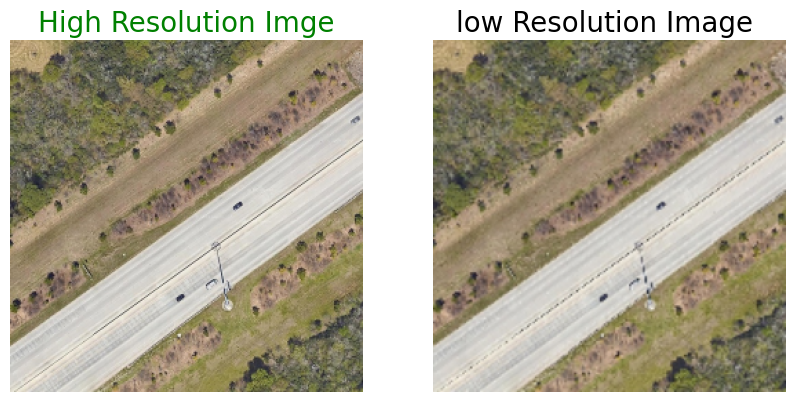

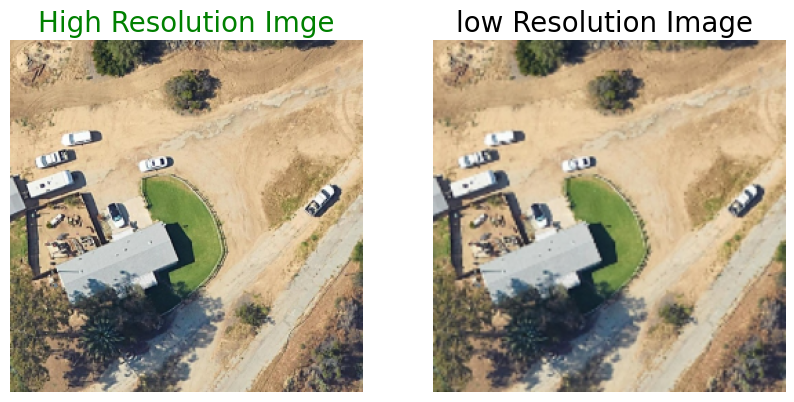

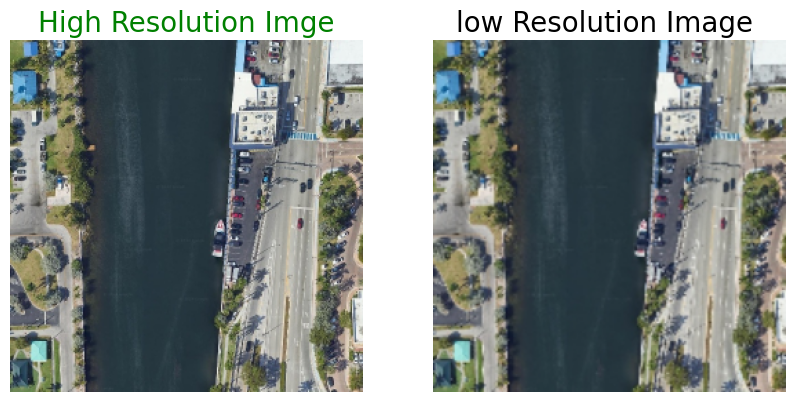

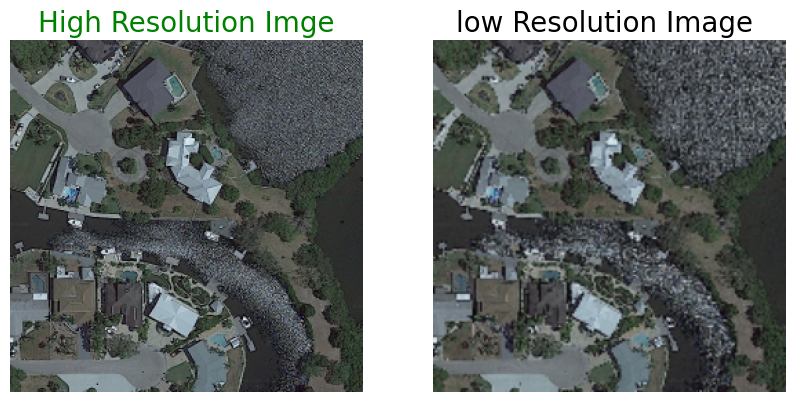

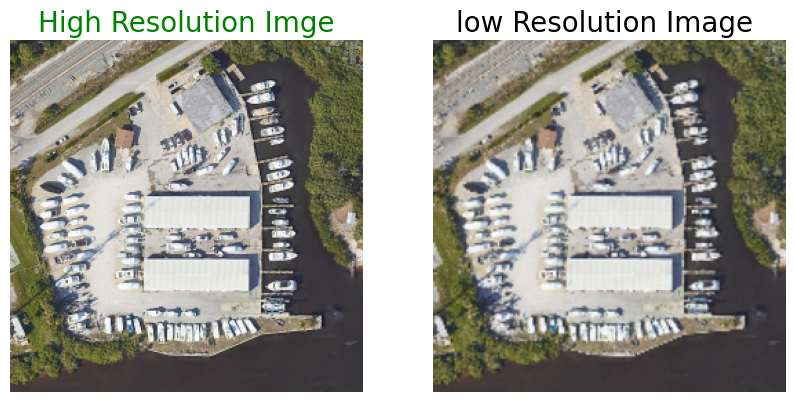

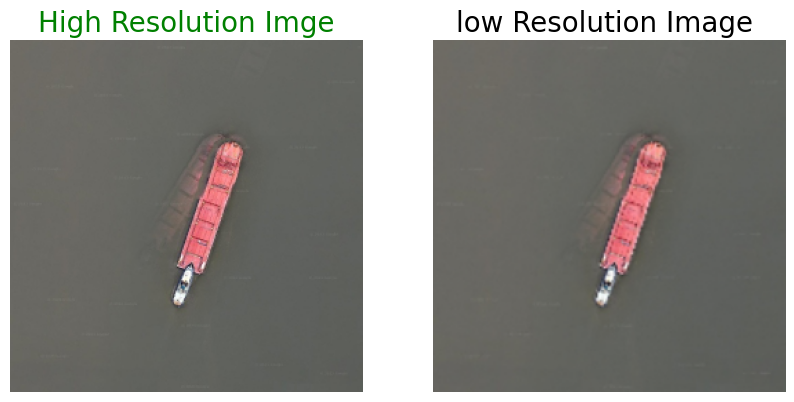

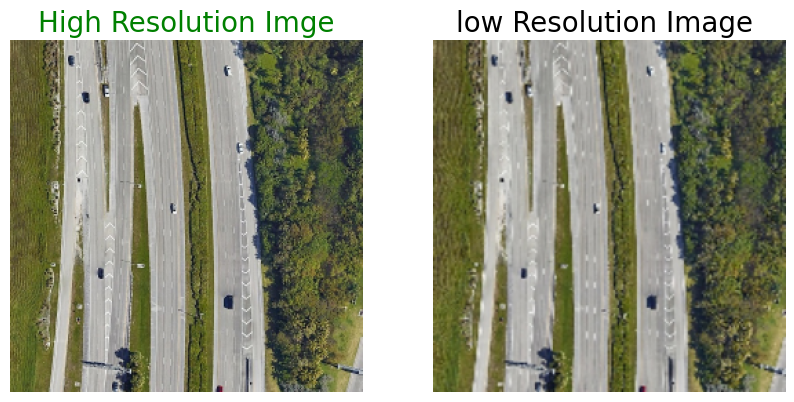

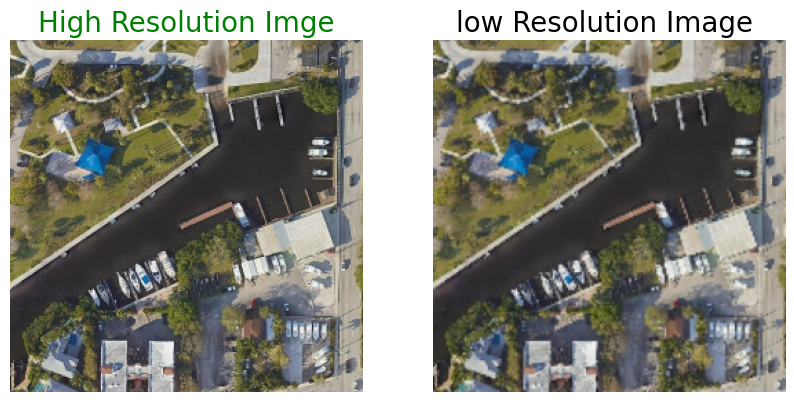

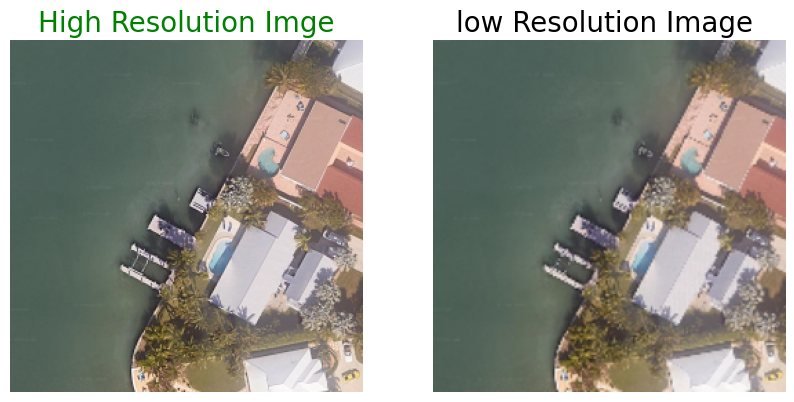

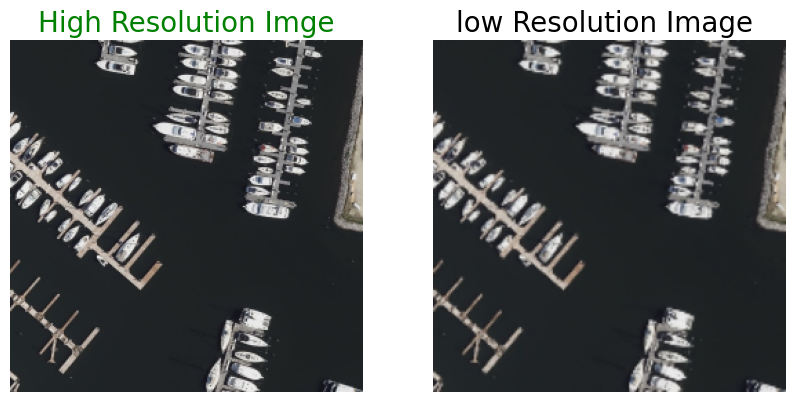

In [3]:
for i in range(10):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

In [4]:
# train_high_image = high_img[:700]
# train_low_image = low_img[:700]
# train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
# train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

# validation_high_image = high_img[700:830]
# validation_low_image = low_img[700:830]
# validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
# validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


# test_high_image = high_img[830:]
# test_low_image = low_img[830:]
# test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
# test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

# print("Shape of training images:",train_high_image.shape)
# print("Shape of test images:",test_high_image.shape)
# print("Shape of validation images:",validation_high_image.shape)

In [5]:
import numpy as np

# Assuming high_img and low_img are already defined

# Calculate the number of samples for each set
total_samples = len(high_img)
train_samples = int(total_samples * 0.7)
valid_samples = int(total_samples * 0.2)
test_samples = total_samples - train_samples - valid_samples

# Split high_img and low_img
train_high_image = high_img[:train_samples]
train_low_image = low_img[:train_samples]
train_high_image = np.reshape(train_high_image, (len(train_high_image), SIZE, SIZE, 3))
train_low_image = np.reshape(train_low_image, (len(train_low_image), SIZE, SIZE, 3))

validation_high_image = high_img[train_samples:train_samples + valid_samples]
validation_low_image = low_img[train_samples:train_samples + valid_samples]
validation_high_image = np.reshape(validation_high_image, (len(validation_high_image), SIZE, SIZE, 3))
validation_low_image = np.reshape(validation_low_image, (len(validation_low_image), SIZE, SIZE, 3))

test_high_image = high_img[train_samples + valid_samples:]
test_low_image = low_img[train_samples + valid_samples:]
test_high_image = np.reshape(test_high_image, (len(test_high_image), SIZE, SIZE, 3))
test_low_image = np.reshape(test_low_image, (len(test_low_image), SIZE, SIZE, 3))

print("Shape of training images:", train_high_image.shape)
print("Shape of test images:", test_high_image.shape)
print("Shape of validation images:", validation_high_image.shape)

print("Shape of training images:", train_low_image.shape)
print("Shape of test images:", test_low_image.shape)
print("Shape of validation images:", validation_low_image.shape)


Shape of training images: (1470, 256, 256, 3)
Shape of test images: (210, 256, 256, 3)
Shape of validation images: (420, 256, 256, 3)
Shape of training images: (1470, 256, 256, 3)
Shape of test images: (210, 256, 256, 3)
Shape of validation images: (420, 256, 256, 3)


In [6]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
from tensorflow.keras import layers
from tensorflow.keras.utils import plot_model

def residual_block_gen(ch=64,k_s=3,st=1):
    model=tf.keras.Sequential([
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),
    tf.keras.layers.Conv2D(ch,k_s,strides=(st,st),padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(),])
    return model

import tensorflow as tf

def Upsample_block(x, ch=256, k_s=3, st=1):
    x = tf.keras.layers.Conv2D(ch, k_s, strides=(st,st), padding='same')(x)
    x = tf.keras.layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(x) # Wrap depth_to_space in a Lambda layer
    x = tf.keras.layers.LeakyReLU()(x)
    return x


lr=tf.keras.layers.Input(shape=(256,256,3))
input_conv=tf.keras.layers.Conv2D(64,9,padding='same')(lr)
input_conv=tf.keras.layers.LeakyReLU()(input_conv)

def model():
    SRRes=input_conv
    for x in range(5):
        res_output=residual_block_gen()(SRRes)
        SRRes=Upsample_block(SRRes)
        SRRes=MaxPooling2D()(SRRes)
        SRRes=tf.keras.layers.Add()([SRRes,res_output])
        SRRes=tf.keras.layers.Conv2D(64,9,padding='same')(SRRes)
    SRRes=tf.keras.layers.BatchNormalization()(SRRes)
    SRRes=tf.keras.layers.Add()([SRRes,input_conv])
    SRRes=Upsample_block(SRRes)
    SRRes=MaxPooling2D()(SRRes)
    #SRRes=Upsample_block(SRRes)
    #SRRes=downsample_image(SRRes,4)
    #SRRes=Upsample_block(SRRes)
    output_sr=tf.keras.layers.Conv2D(3,9,activation='sigmoid',padding='same')(SRRes)
    return tf.keras.models.Model(lr,output_sr)

model = model()

model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'mean_absolute_error',
              metrics = ['acc'])

In [7]:
# model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'mean_absolute_error',
#               metrics = ['acc'])
# history=model.fit(train_low_image, train_high_image, epochs = 1, batch_size = 4,
#           validation_data = (validation_low_image,validation_high_image))

Epoch 1/100


I0000 00:00:1710380973.291472      78 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


368/368 ━━━━━━━━━━━━━━━━━━━━ 0s 579ms/step - acc: 0.4649 - loss: 0.1009

2024-03-14 01:53:48.771381: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=4,k3=0} for conv (f32[32,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,64,256,256]{3,2,1,0}, f32[64,64,9,9]{3,2,1,0}, f32[64]{0}), window={size=9x9 pad=4_4x4_4}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-03-14 01:53:48.951355: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.180070663s
Trying algorithm eng11{k2=4,k3=0} for conv (f32[32,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,64,256,256]{3,2,1,0}, f32[64,64,9,9]{3,2,1,0}, f32[64]{0}), window={size=9x9 pad=4_4x4_4}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is

45/46 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

2024-03-14 01:55:23.140528: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=4,k3=0} for conv (f32[30,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[30,64,256,256]{3,2,1,0}, f32[64,64,9,9]{3,2,1,0}, f32[64]{0}), window={size=9x9 pad=4_4x4_4}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-03-14 01:55:23.246673: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.106292369s
Trying algorithm eng11{k2=4,k3=0} for conv (f32[30,64,256,256]{3,2,1,0}, u8[0]{0}) custom-call(f32[30,64,256,256]{3,2,1,0}, f32[64,64,9,9]{3,2,1,0}, f32[64]{0}), window={size=9x9 pad=4_4x4_4}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is

46/46 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step
 - train_PSNR: 20.09 dB
14/14 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step
 - val_PSNR: 19.68 dB
368/368 ━━━━━━━━━━━━━━━━━━━━ 424s 1s/step - acc: 0.4650 - loss: 0.1008 - val_acc: 0.5404 - val_loss: 0.0802 - train_PSNR: 20.0854 - val_PSNR: 19.6793
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step
 - train_PSNR: 22.37 dB
14/14 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
 - val_PSNR: 22.88 dB
368/368 ━━━━━━━━━━━━━━━━━━━━ 309s 840ms/step - acc: 0.5612 - loss: 0.0654 - val_acc: 0.7056 - val_loss: 0.0514 - train_PSNR: 22.3666 - val_PSNR: 22.8804
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step
 - train_PSNR: 23.79 dB
14/14 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
 - val_PSNR: 24.02 dB
368/368 ━━━━━━━━━━━━━━━━━━━━ 309s 839ms/step - acc: 0.6000 - loss: 0.0561 - val_acc: 0.6891 - val_loss: 0.0448 - train_PSNR: 23.7890 - val_PSNR: 24.0181
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 64s 1s/step
 - train_PSNR: 20.67 dB
14/14 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
 - val_PSNR: 21.73 dB
368/368 ━━━

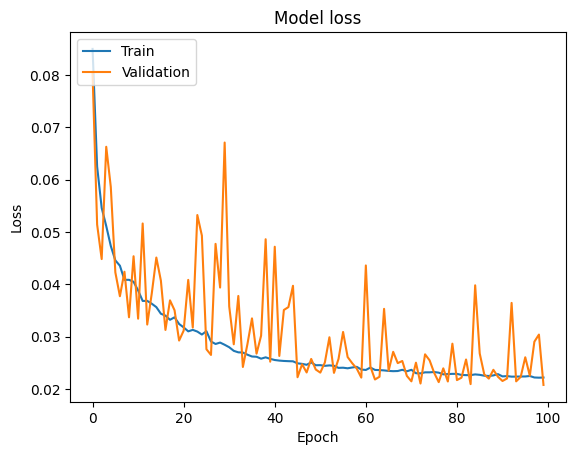

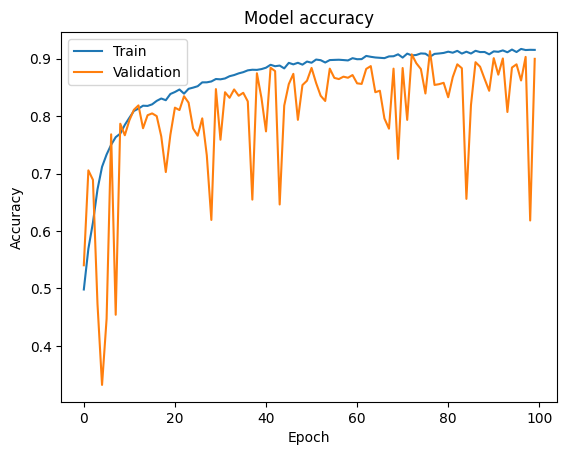

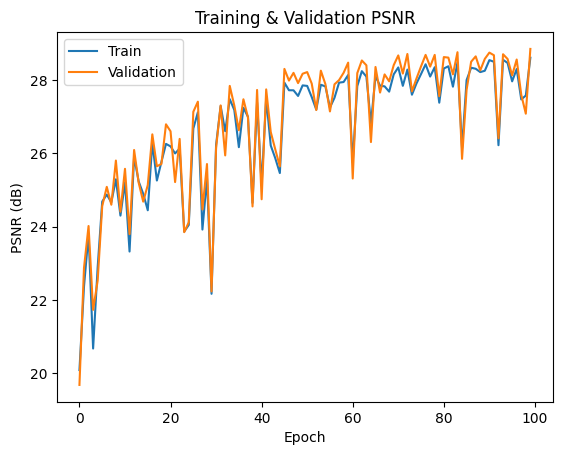

In [8]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio

class PSNRCallback(tf.keras.callbacks.Callback):
    def __init__(self, train_data, val_data):
        super(PSNRCallback, self).__init__()
        self.train_data = train_data
        self.val_data = val_data

    def on_epoch_end(self, epoch, logs=None):
        # Calculate training PSNR
        x_train, y_train = self.train_data
        y_train_pred = self.model.predict(x_train)
        train_psnr = np.mean([peak_signal_noise_ratio(y_train[i], y_train_pred[i]) for i in range(len(y_train))])
        print(f' - train_PSNR: {train_psnr:.2f} dB')

        # Calculate validation PSNR
        x_val, y_val = self.val_data
        y_val_pred = self.model.predict(x_val)
        val_psnr = np.mean([peak_signal_noise_ratio(y_val[i], y_val_pred[i]) for i in range(len(y_val))])
        print(f' - val_PSNR: {val_psnr:.2f} dB')

        if logs is not None:
            logs['train_PSNR'] = train_psnr
            logs['val_PSNR'] = val_psnr

# Define your model and compile it

history = model.fit(train_low_image, train_high_image, epochs=100, batch_size=4,
                    validation_data=(validation_low_image, validation_high_image),
                    callbacks=[PSNRCallback((train_low_image, train_high_image), (validation_low_image, validation_high_image))])

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation PSNR
plt.plot(history.history['train_PSNR'])
plt.plot(history.history['val_PSNR'])
plt.title('Training & Validation PSNR')
plt.ylabel('PSNR (dB)')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [9]:
def PSNR(y_true,y_pred):
  mse=tf.reduce_mean( (y_true - y_pred) ** 2 )
  return 20 * log10(1 / (mse ** 0.5))

def log10(x):
  numerator = tf.math.log(x)
  denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
  return numerator / denominator

def pixel_MSE(y_true,y_pred):
  return tf.reduce_mean( (y_true - y_pred) ** 2 )

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


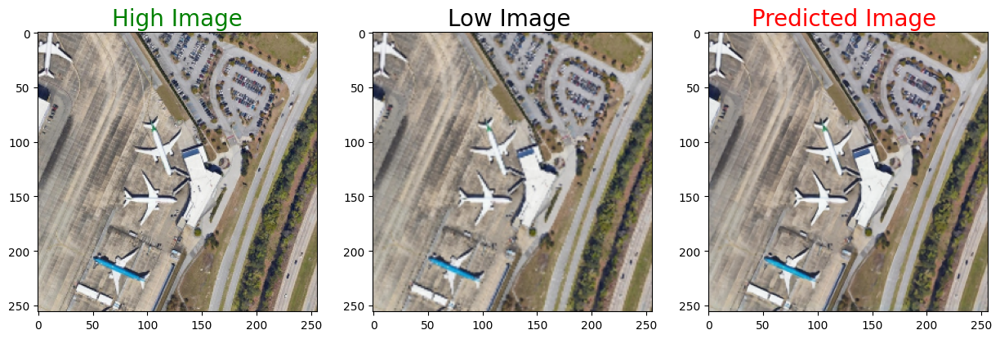

PSNR tf.Tensor(27.37242, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


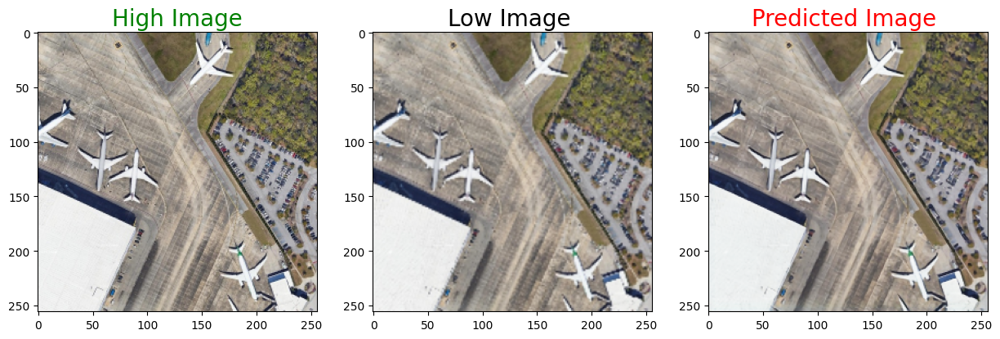

PSNR tf.Tensor(27.571993, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


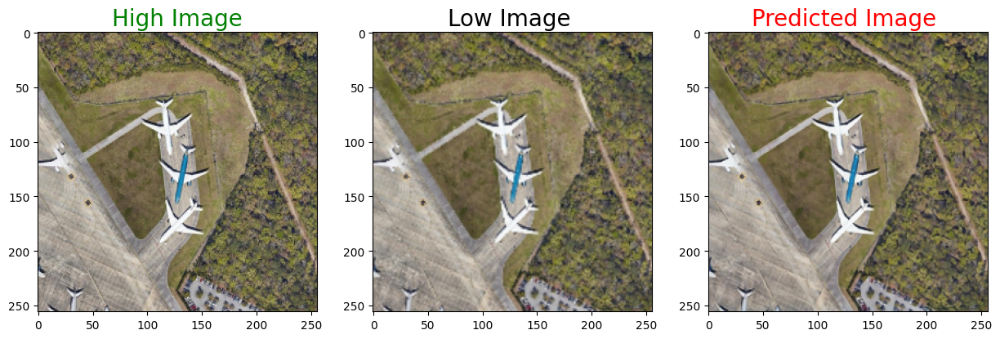

PSNR tf.Tensor(27.50945, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


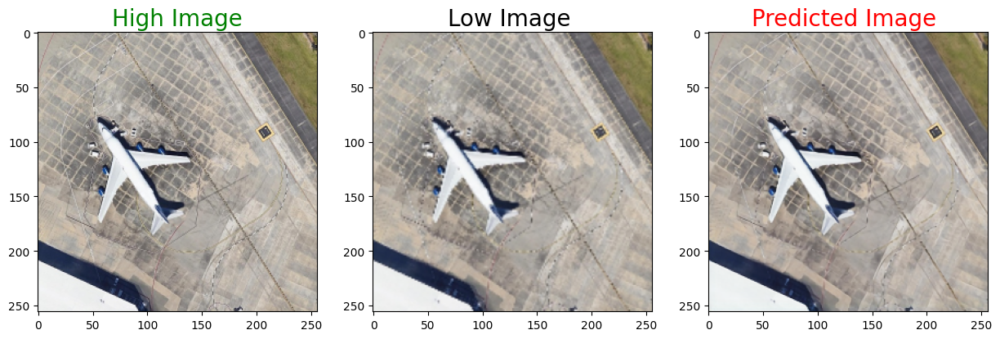

PSNR tf.Tensor(29.665606, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


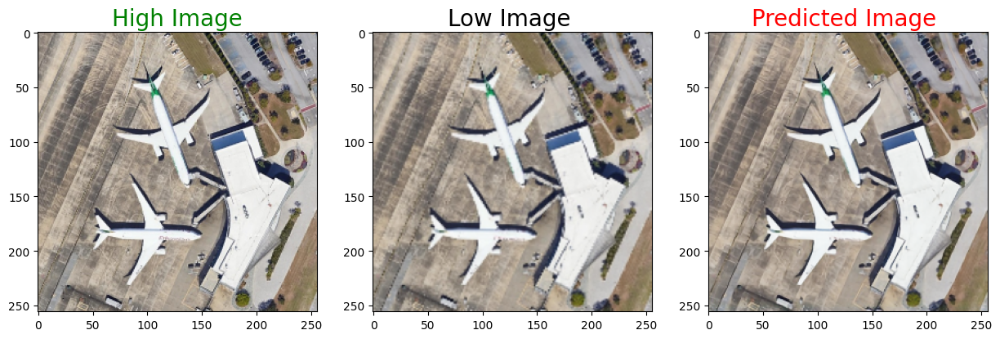

PSNR tf.Tensor(28.342155, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


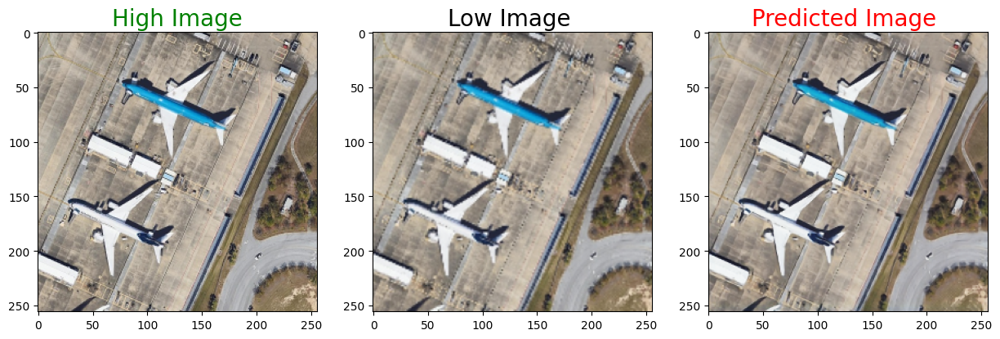

PSNR tf.Tensor(28.32383, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


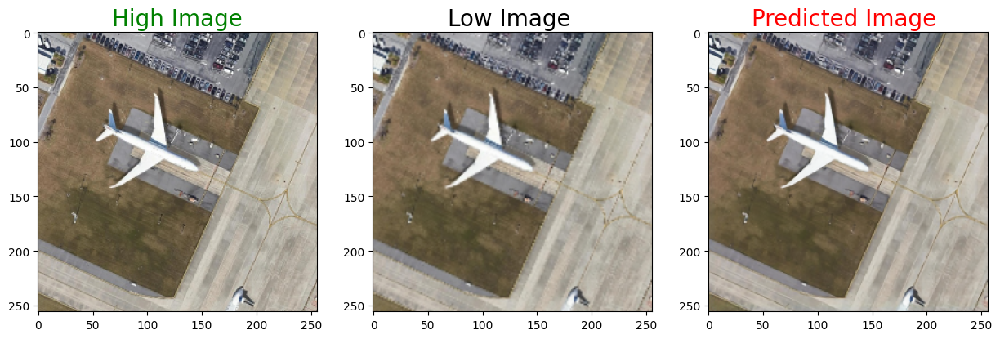

PSNR tf.Tensor(29.616081, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


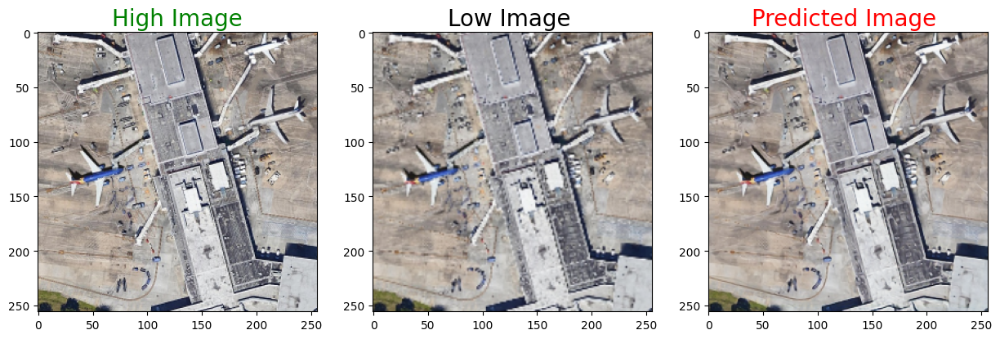

PSNR tf.Tensor(25.155296, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


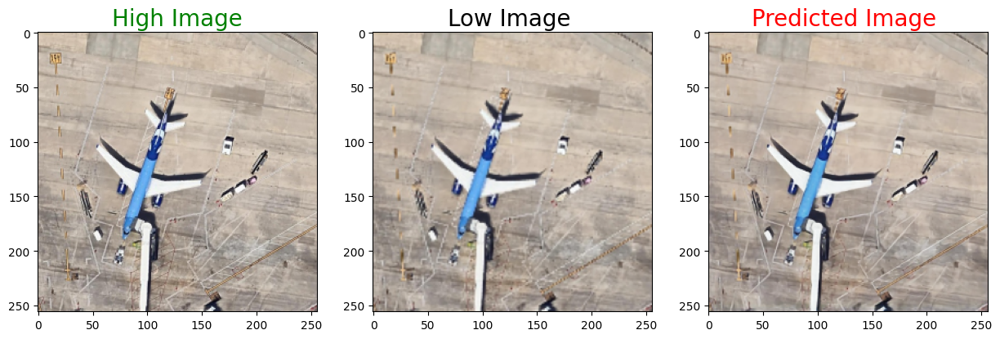

PSNR tf.Tensor(30.202415, shape=(), dtype=float32)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


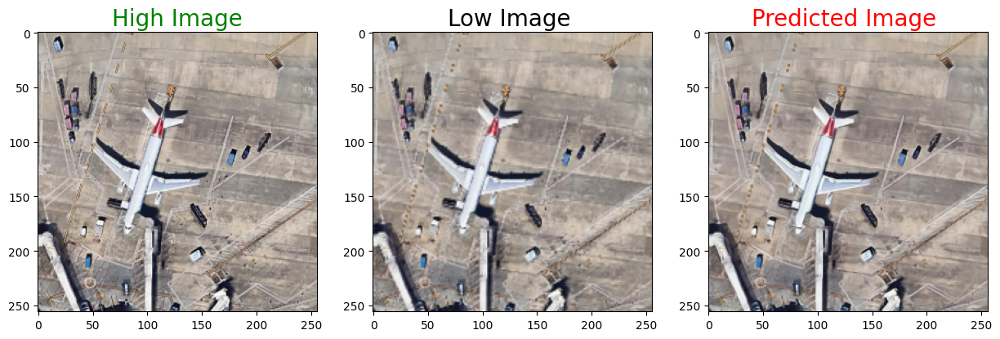

PSNR tf.Tensor(28.668137, shape=(), dtype=float32)


In [10]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(10,20):
    
    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)
    print('PSNR', PSNR(test_high_image[i],predicted))

In [11]:

import numpy as np
import tensorflow as tf
from tqdm.auto import tqdm  # Import tqdm

def PSNR(y_true, y_pred):
    mse = tf.reduce_mean((y_true - y_pred) ** 2)
    return 20 * log10(1 / tf.sqrt(mse))

def log10(x):
    numerator = tf.math.log(x)
    denominator = tf.math.log(tf.constant(10, dtype=numerator.dtype))
    return numerator / denominator

def pixel_MSE(y_true, y_pred):
    return tf.reduce_mean((y_true - y_pred) ** 2)

def calculate_psnr(model, test_low_images, test_high_images):
    psnr_scores = []
    with tqdm(total=len(test_low_images), leave=False) as pbar:
        for i in range(len(test_low_images)):
            # Suppress output with verbose=0
            predicted = np.clip(model.predict(test_low_images[i].reshape(1, SIZE, SIZE, 3), verbose=0), 0.0, 1.0).reshape(SIZE, SIZE, 3)
            psnr_score = PSNR(test_high_images[i], predicted)
            psnr_scores.append(psnr_score)
            pbar.update(1)
    average_psnr = np.mean(psnr_scores)
    return average_psnr

# Assuming you have `model`, `test_low_image`, and `test_high_image` defined elsewhere
average_psnr = calculate_psnr(model, test_low_image, test_high_image)
print('Average PSNR on the test set:', average_psnr)


  0%|          | 0/210 [00:00<?, ?it/s]

Average PSNR on the test set: 29.121782
